In [ ]:
from google.colab.patches import cv2_imshow
from sklearn.preprocessing import LabelEncoder
import cv2 as cv
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
%matplotlib inline
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.metrics import accuracy_score
import pandas as pd
import seaborn as sns

In [ ]:
dataset = '/content/drive/MyDrive/Resources/Faces/Train/'

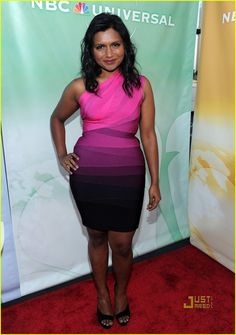

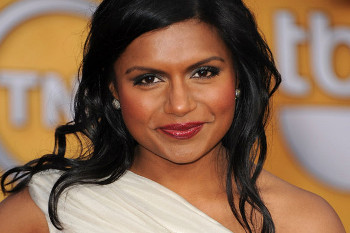

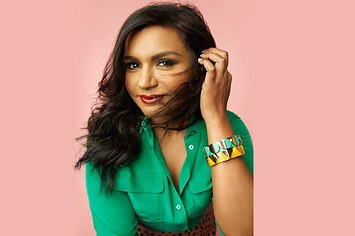

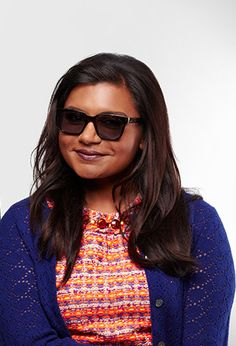

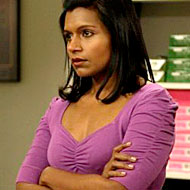

...

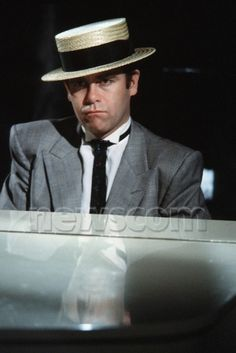

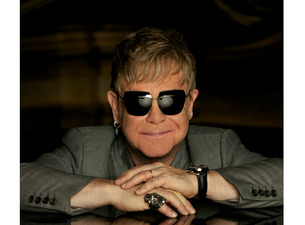

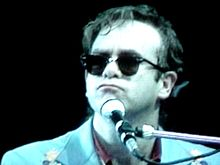

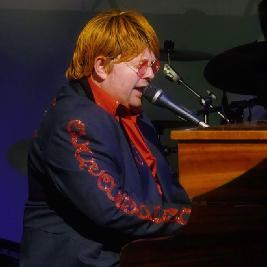

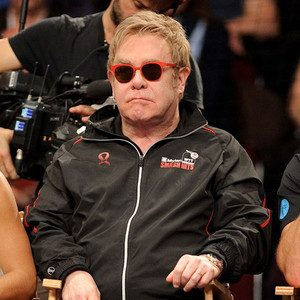

In [ ]:
#showing Dataset
for imgpath in os.listdir('/content/drive/MyDrive/Resources/Faces/Train/'):
    for filename in os.listdir('/content/drive/MyDrive/Resources/Faces/Train/'+ imgpath):
          filename = '/content/drive/MyDrive/Resources/Faces/Train/' + imgpath + '/' + filename
          img=cv.imread(filename)
          cv2_imshow(img)
          cv.waitKey(0)

In [ ]:
haar_cascade='/content/drive/MyDrive/haarcascade_frontalface_default.xml'

In [ ]:
def detect_face(input_img):
    img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
    face_cascade = cv.CascadeClassifier(haar_cascade)
    faces = face_cascade.detectMultiScale(img, scaleFactor=1.1, minNeighbors=8);
    if (len(faces) == 0):
        return -1, -1
    (x, y, w, h) = faces[0]
    return img[y:y+w, x:x+h], faces[0]

In [ ]:
def prepare_training_dataset(data):
    detected_faces = []
    face_labels = []
    
    for filename in os.listdir(data):
        label = str(filename)
        for imgpath in os.listdir(data+filename):
            imgpath=data+filename+'/'+imgpath
            image = cv.imread(imgpath)
            face, rect = detect_face(image)
            if face is not -1:
                resized_face = cv.resize(face, (150,150), interpolation = cv.INTER_AREA)
                detected_faces.append(face)
                face_labels.append(label)

    return detected_faces, face_label

In [ ]:
detected_faces, face_label = prepare_training_dataset("/content/drive/MyDrive/Resources/Faces/Train/")

In [ ]:
print("Total detected faces: ", len(detected_faces))
print("Total  counted labels: ", len(face_label))

Total faces:  80
Total labels:  80


In [ ]:
face_label

['Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Mindy Kaling',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Jerry Seinfield',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Madonna',
 'Ben Afflek',
 'Ben Afflek',
 'Ben Afflek',
 'Ben Afflek',
 'Ben Afflek

In [ ]:
lbph = cv.face.LBPHFaceRecognizer_create(radius=2, neighbors=16)

In [ ]:
le = LabelEncoder()
face_labels = le.fit_transform(face_label)

In [ ]:
face_labels

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [ ]:
lbph.train(detected_faces, np.array(face_labels))

In [ ]:
def draw_rectangle(test_image, rect):
    (x, y, w, h) = rect
    cv.rectangle(test_image, (x, y), (x+w, y+h), (0, 255, 0), 2)

def draw_text(test_image, label_text, x, y):
    cv.putText(test_image, label_text, (x, y), cv.FONT_HERSHEY_PLAIN, 1.5, (0, 255, 0), 2)

In [ ]:
def predict(test_data):
    face, rect = detect_face(test_data)
    label= lbph.predict(face)
    label_text = names[label[0]]
    draw_rectangle(test_data, rect)
    draw_text(test_data, label_text, rect[0], rect[1]-5)
    return test_data, label_text

In [ ]:
names=['Ben Afflek','Elton John','Jerry Seinfield','Madonna','Mindy Kaling']

In [ ]:
test_data = cv.imread("/content/drive/MyDrive/Resources/Faces/val/Ben Afflek/1.jpg")

In [ ]:
predicted_image, label = predict(test_data)

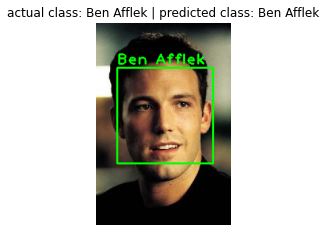

In [ ]:
fig = plt.figure()
ax1 = fig.add_axes((0.1, 0.2, 0.8, 0.7))
ax1.set_title('actual class: ' + names[0]+ ' | ' + 'predicted class: ' + label)#change the names array for different actual class ex- Mindy Kaling- names[4]
plt.axis("off")
imgplot = plt.imshow(cv.cvtColor(predicted_image, cv.COLOR_BGR2RGB))
plt.show()

In [ ]:
l=[]
a=[]
for imgpath1 in os.listdir('/content/drive/MyDrive/Resources/Faces/val/'):
    for filename in os.listdir('/content/drive/MyDrive/Resources/Faces/val/'+ imgpath1):
          filename = '/content/drive/MyDrive/Resources/Faces/val/' + imgpath1 + '/' + filename
          img=cv.imread(filename)
          pred,lab=predict(img)
          a.append(imgpath1)
          l.append(lab)
          print('Actual class :'+imgpath1+' predicted class :'+lab)

Actual class :Ben Afflek predicted class :Ben Afflek
Actual class :Ben Afflek predicted class :Ben Afflek
Actual class :Ben Afflek predicted class :Ben Afflek
Actual class :Ben Afflek predicted class :Ben Afflek
Actual class :Ben Afflek predicted class :Ben Afflek
Actual class :Elton John predicted class :Elton John
Actual class :Elton John predicted class :Madonna
Actual class :Elton John predicted class :Elton John
Actual class :Elton John predicted class :Madonna
Actual class :Elton John predicted class :Elton John
Actual class :Madonna predicted class :Madonna
Actual class :Madonna predicted class :Ben Afflek
Actual class :Madonna predicted class :Jerry Seinfield
Actual class :Madonna predicted class :Ben Afflek
Actual class :Madonna predicted class :Madonna
Actual class :Mindy Kaling predicted class :Mindy Kaling
Actual class :Mindy Kaling predicted class :Mindy Kaling
Actual class :Mindy Kaling predicted class :Mindy Kaling
Actual class :Mindy Kaling predicted class :Madonna
Actu

In [ ]:
print(a)
print(l)

['Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Elton John', 'Elton John', 'Elton John', 'Elton John', 'Elton John', 'Madonna', 'Madonna', 'Madonna', 'Madonna', 'Madonna', 'Mindy Kaling', 'Mindy Kaling', 'Mindy Kaling', 'Mindy Kaling', 'Mindy Kaling', 'Jerry Seinfeild', 'Jerry Seinfeild', 'Jerry Seinfeild', 'Jerry Seinfeild', 'Jerry Seinfeild']
['Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Ben Afflek', 'Elton John', 'Madonna', 'Elton John', 'Madonna', 'Elton John', 'Madonna', 'Ben Afflek', 'Jerry Seinfield', 'Ben Afflek', 'Madonna', 'Mindy Kaling', 'Mindy Kaling', 'Mindy Kaling', 'Madonna', 'Madonna', 'Jerry Seinfield', 'Jerry Seinfield', 'Jerry Seinfield', 'Jerry Seinfield', 'Madonna']


In [ ]:
le = LabelEncoder()
imgpath1=le.fit_transform(a)
lab = le.fit_transform(l)

In [ ]:
def print_cm(confusion_matrix,class_names,figsize=(10,7),fontsize=14):
    df_cm = pd.DataFrame(
        confusion_matrix, index=class_names, columns=class_names, 
    )
    fig = plt.figure(figsize=figsize)
    try:
        heatmap = sns.heatmap(df_cm, annot=True, fmt="d")
    except ValueError:
        raise ValueError("Confusion matrix values must be integers.")
    heatmap.yaxis.set_ticklabels(heatmap.yaxis.get_ticklabels(), rotation=0, ha='right', fontsize=fontsize)
    heatmap.xaxis.set_ticklabels(heatmap.xaxis.get_ticklabels(), rotation=45, ha='right', fontsize=fontsize)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

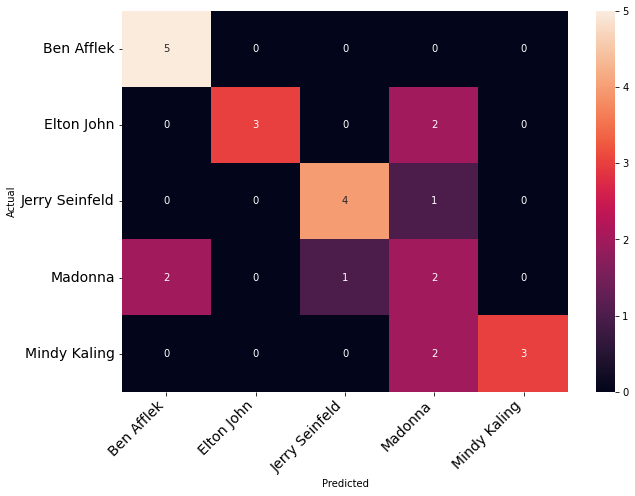

In [ ]:
cm = confusion_matrix (imgpath1, lab)
print_cm(cm,['Ben Afflek', 'Elton John', 'Jerry Seinfeld', 'Madonna', 'Mindy Kaling'])

In [ ]:
print(classification_report(imgpath1,lab))

              precision    recall  f1-score   support

           0       0.71      1.00      0.83         5
           1       1.00      0.60      0.75         5
           2       0.80      0.80      0.80         5
           3       0.29      0.40      0.33         5
           4       1.00      0.60      0.75         5

    accuracy                           0.68        25
   macro avg       0.76      0.68      0.69        25
weighted avg       0.76      0.68      0.69        25

